In [ ]:
import pandas as pd

#file_in = 'data_scenarios_a_example.in'
#file_in = 'data_scenarios_b_mumbai.in'
#file_in = 'data_scenarios_c_metropolis.in'
file_in = 'data_scenarios_d_polynesia.in'
#file_in = 'data_scenarios_e_sanfrancisco.in'
#file_in = 'data_scenarios_f_tokyo.in'

with open(file_in, 'r') as f:
    first_line = f.readline()
    W, H = tuple([int(x) for x in first_line.split(' ')])
    print("{} {}".format(W, H))
    first_line = f.readline()
    N, M, R = tuple([int(x) for x in first_line.split(' ')])
    print("{} {} {}".format(N, M, R))
    data = []
    for rid, line in enumerate(f.readlines()):
        ride = tuple([x.strip() for x in line.split(' ')])
        # ride = tuple([int(x) for x in line.split(' ')]) # if integer
        data.append(ride)


df = pd.DataFrame(data)
# fill NAN
df = df.fillna('NO_CLASS')
# split dataframe
buildings = df.iloc[:N]
antennas = df.iloc[N:]

In [9]:
buildings[0] = pd.to_numeric(buildings[0])
buildings[1] = pd.to_numeric(buildings[1])
buildings[2] = pd.to_numeric(buildings[2])
buildings[3] = pd.to_numeric(buildings[3])


<ipython-input-9-77ec81a8de41>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  buildings[0] = pd.to_numeric(buildings[0])
<ipython-input-9-77ec81a8de41>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  buildings[1] = pd.to_numeric(buildings[1])
<ipython-input-9-77ec81a8de41>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

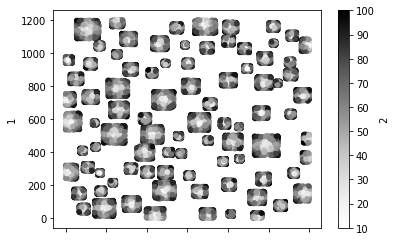

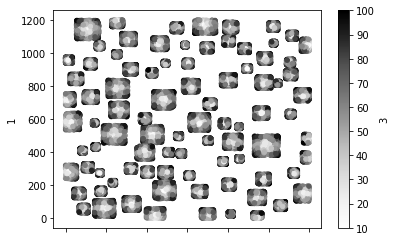

In [10]:

ax1 = buildings.plot.scatter(x=0,
                      y=1,
                      c=2)
ax1 = buildings.plot.scatter(x=0,
                      y=1,
                      c=3)

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

new = antennas[[0,1]]
new[0] = pd.to_numeric(new[0])
new[1] = pd.to_numeric(new[1])

#sns.heatmap(new, annot=True)
new.describe()


<ipython-input-13-4fdbf7e69772>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new[0] = pd.to_numeric(new[0])
<ipython-input-13-4fdbf7e69772>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new[1] = pd.to_numeric(new[1])


,0,1
count,1123.000000,1123.000000
mean,7.283170,2351.538736
std,8.886888,1422.399655
min,0.000000,1.000000
25%,3.000000,1107.500000
50%,6.000000,2262.000000
75%,9.000000,3528.000000
max,100.000000,4994.000000


' ts.plot.density()\nplt.figure()\nts.plot.bar(stacked=True)\nplt.figure()\nts.plot.hist(alpha=0.5)\nplt.figure()\nts.diff().hist(color="k", alpha=0.5, bins=50)\nplt.figure()\nts.plot.box()\nplt.figure()\nts.plot.area()\nplt.figure()\nts.plot(subplots=True, figsize=(6, 6));  '

<Figure size 432x288 with 0 Axes>

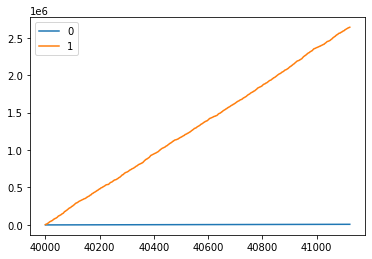

<Figure size 432x288 with 0 Axes>

In [14]:
import matplotlib.pyplot as plt

plt.close("all")
ts = new.cumsum()
plt.figure()
ts.plot()
plt.figure()
""" ts.plot.density()
plt.figure()
ts.plot.bar(stacked=True)
plt.figure()
ts.plot.hist(alpha=0.5)
plt.figure()
ts.diff().hist(color="k", alpha=0.5, bins=50)
plt.figure()
ts.plot.box()
plt.figure()
ts.plot.area()
plt.figure()
ts.plot(subplots=True, figsize=(6, 6));  """

In [15]:
### CLUSTER
from sklearn.cluster import DBSCAN
import numpy as np
X = np.array([[1, 2], [2, 2], [2, 3],
              [8, 7], [8, 8], [25, 80]])
clustering = DBSCAN(eps=3, min_samples=2).fit(X)
clustering.labels_

clustering

DBSCAN(eps=3, min_samples=2)

In [ ]:
###################### END ###############

In [ ]:
# some stats
max_value = df[0].max()
count_dist = df.iloc[:].value_counts()
print(count_dist)
count_dist.describe()
#df.describe()


In [ ]:
import numpy as np
from sklearn import preprocessing
# Encode target labels with value between 0 and n_classes-1.
le = preprocessing.LabelEncoder()

# Delete first column
df= df.drop(df.columns[0], axis=1)
# print(df.to_numpy().ravel()) //all DF data to array

# creating a list of dataframe columns 
columns = list(df) 

label_classes = []
# read all element on DF except first column
for i in columns:
    if type(df[i][0]) is str:
       label_classes.append(df[i].to_numpy().flatten())

# conver list to array
label_classes_array = np.array(label_classes).flatten()

# remove duplicates
# print(set(label_classes_array))

# Fit label encoder
le.fit(label_classes_array)
print(le.classes_)

columns = list(df)

for i in columns:
    if  (type(df[i][1])) is str:
        df[i] = le.transform(df[i])

df.head(5)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.heatmap(df, annot=True)


In [ ]:
import matplotlib.pyplot as plt

df = antennas;

plt.close("all")
ts = df.cumsum()
plt.figure()
ts.plot()
plt.figure()
ts.plot.density()
plt.figure()
#ts.plot.bar(stacked=True)
plt.figure()
ts.plot.hist(alpha=0.5)
plt.figure()
ts.diff().hist(color="k", alpha=0.5, bins=50)
plt.figure()
ts.plot.box()
plt.figure()
ts.plot.area()
plt.figure()
ts.plot(subplots=True, figsize=(6, 6));